# Yelp Reviews - Sentiment Analysis through a Naive Bayes Model

**Name: SeungHeon Han**

## 1. Data Exploration and Analysis

In [1]:
import pandas as pd
import numpy as np
import os
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.figure_factory as ff
import pandas as pd
import math
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB, BernoulliNB
from sklearn.metrics import classification_report, confusion_matrix
from nltk.corpus import stopwords
stp_wrds = stopwords.words('english')

import warnings
warnings.filterwarnings("ignore")
pd.set_option('display.max_colwidth', None)

In [2]:
#os.chdir('data')
data = pd.read_csv('yelp.csv')
data.head(3)

,business_id,date,review_id,stars,text,type,user_id,cool,useful,funny
0,9yKzy9PApeiPPOUJEtnvkg,2011-01-26,fWKvX83p0-ka4JS3dc6E5A,5,"My wife took me here on my birthday for breakfast and it was excellent. The weather was perfect which made sitting outside overlooking their grounds an absolute pleasure. Our waitress was excellent and our food arrived quickly on the semi-busy Saturday morning. It looked like the place fills up pretty quickly so the earlier you get here the better.\n\nDo yourself a favor and get their Bloody Mary. It was phenomenal and simply the best I've ever had. I'm pretty sure they only use ingredients from their garden and blend them fresh when you order it. It was amazing.\n\nWhile EVERYTHING on the menu looks excellent, I had the white truffle scrambled eggs vegetable skillet and it was tasty and delicious. It came with 2 pieces of their griddled bread with was amazing and it absolutely made the meal complete. It was the best ""toast"" I've ever had.\n\nAnyway, I can't wait to go back!",review,rLtl8ZkDX5vH5nAx9C3q5Q,2,5,0
1,ZRJwVLyzEJq1VAihDhYiow,2011-07-27,IjZ33sJrzXqU-0X6U8NwyA,5,"I have no idea why some people give bad reviews about this place. It goes to show you, you can please everyone. They are probably griping about something that their own fault...there are many people like that.\n\nIn any case, my friend and I arrived at about 5:50 PM this past Sunday. It was pretty crowded, more than I thought for a Sunday evening and thought we would have to wait forever to get a seat but they said we'll be seated when the girl comes back from seating someone else. We were seated at 5:52 and the waiter came and got our drink orders. Everyone was very pleasant from the host that seated us to the waiter to the server. The prices were very good as well. We placed our orders once we decided what we wanted at 6:02. We shared the baked spaghetti calzone and the small ""Here's The Beef"" pizza so we can both try them. The calzone was huge and we got the smallest one (personal) and got the small 11"" pizza. Both were awesome! My friend liked the pizza better and I liked the calzone better. The calzone does have a sweetish sauce but that's how I like my sauce!\n\nWe had to box part of the pizza to take it home and we were out the door by 6:42. So, everything was great and not like these bad reviewers. That goes to show you that you have to try these things yourself because all these bad reviewers have some serious issues.",review,0a2KyEL0d3Yb1V6aivbIuQ,0,0,0
2,6oRAC4uyJCsJl1X0WZpVSA,2012-06-14,IESLBzqUCLdSzSqm0eCSxQ,4,love the gyro plate. Rice is so good and I also dig their candy selection :),review,0hT2KtfLiobPvh6cDC8JQg,0,1,0


In [3]:
# get the 'word' count for each review
count_chrt = data.text.apply(len)
count_word = data.text.apply(lambda x: len(x.split()))

count_df = pd.concat([count_chrt, count_word], axis = 1)
count_df.columns = ["Character", "Word"] 
count_df.index.names = ["Text"]
count_df

,Character,Word
Text,,
0,889,155
1,1345,257
2,76,16
3,419,76
4,469,86
...,...,...
9995,668,120
9996,881,161
9997,1425,262


In [4]:
dscrb_table = pd.concat([count_df["Character"].describe(), count_df["Word"].describe()], axis=1)
dscrb_table

,Character,Word
count,10000.000000,10000.000000
mean,710.738700,131.039600
std,617.399827,113.584114
min,1.000000,1.000000
25%,294.000000,54.000000
50%,541.500000,101.000000
75%,930.000000,173.000000
max,4997.000000,945.000000


**1).** Plot Histograms and Density plots of the character and word counts 

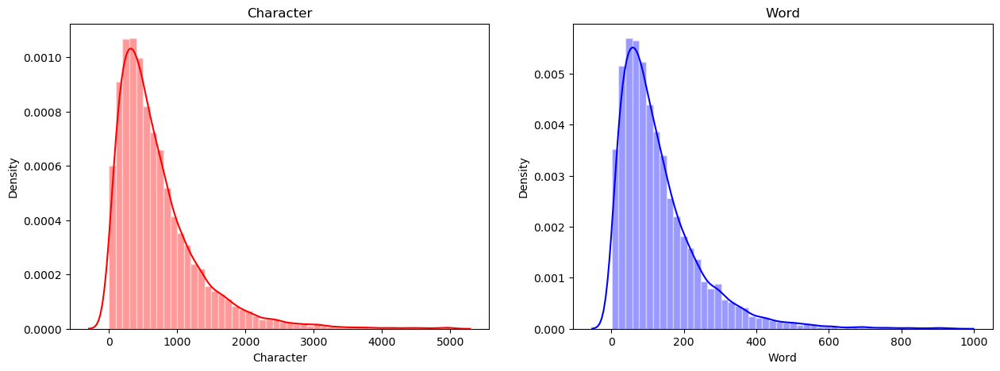

In [5]:
# Plot Histograms and Density plots of the character and word counts 

plt.figure(figsize=(15, 5))
plt.subplot(121)
sns.distplot(count_df["Character"], color='red',
             hist_kws={"edgecolor": 'white'}).set_title('Character')


plt.subplot(122)
sns.distplot(count_df["Word"], color='blue',
             hist_kws={"edgecolor": 'white'}).set_title('Word')

plt.show()

* when splitting each document (word count), the number of counted characters decrase exponentially because spaces or tabs are not counted and quotation marks and punctuations are also not counted separately but counted with their neigbor words. 
* The number of words of the majority of documents fall into the range around 100 making the distribution skewed to the right

**2).** Explore all the reviews made up of 1 or 2 words and what effect including these in the training and test data might have.  

In [6]:
index_list = list(count_df.loc[count_df["Word"].le(2)].index)
data.loc[index_list, ["text", "stars"]]

,text,stars
217,Love Krista!,5
284,Great service,5
679,Excellent burger,5
1075,Nic-nacs galore!,5
1290,No good,2
1919,D-scust-ing.,1
2016,Amazing. Romantic!,5
2733,Good food,5
2892,Great Job!,5
2931,Super!,5


* the 1 or 2 word reviews look very concise and straightforward in terms of their sentiment and those are pretty well matching to the stars (positive = 4&5, negative = 1 & 2, we don't consider 3). Therefore, when training a sentiment classification model with the training set including part of these reviews, I can expect that the words here properly increase the propabilities of such vocabularies being classified into positive or negative ("Great", "Good", "Super", "Excellent" etc -> positive vocabulary, "Horrible", "Don't" etc -> negative vocabulary). If you predict the labels of these reviews as a test set, most of them seem to be expected to be classified accurately as long as the learner is well trained but the instance like "No good", the review consisting of both positive and negative vocabularies in the same ratio, cannot be guaranteed due to the lack of information on the review's sentiment that is being provided to the classifier.

**3).** clean the reviews and explore 1 and 2 word reveiws again.

In [7]:
# text cleaning function
import re

def clean(text, lower = False):
    text = re.sub("[^A-Za-z ']", ' ', text) 
    if lower:
        return re.sub("[ ]+", ' ', text.lower())
    return re.sub("[ ]+", ' ', text)

In [8]:
# assign "clean_text" column to the cleaned text data
for i in range(len(data)):
    data.loc[i, "clean_text"] = clean(data.loc[i, "text"], lower = True)

In [9]:
# rerun the word counts for the cleaned text and compare it to the original text
word = data.text.apply(lambda x: len(x.split()))
cleaned_word = data.clean_text.apply(lambda x: len(x.split()))

clean_text_df = pd.concat([word, cleaned_word], axis = 1)
clean_text_df.columns = ["original", "cleaned"] 
clean_text_df.index.names = ["Text"]
clean_text_df

,original,cleaned
Text,,
0,155,155
1,257,253
2,16,15
3,76,77
4,86,84
...,...,...
9995,120,117
9996,161,161
9997,262,259


In [10]:
# compare the number of 1 or 2 word reviews between the original text and cleaned text columns 
original_index = list(clean_text_df.loc[clean_text_df["original"].le(2)].index)
cleaned_index = list(clean_text_df.loc[clean_text_df["cleaned"].le(2)].index)
print("the number of original 1 or 2 word reivews: %g"  %len(original_index))
print("the number of cleaned 1 or 2 word reivews: %g"  %len(cleaned_index))

the number of original 1 or 2 word reivews: 26
the number of cleaned 1 or 2 word reivews: 24


In [11]:
data.index.names = ["Text"]
pd.merge(data.loc[original_index, ["text"]], data.loc[cleaned_index, ["clean_text"]], on = "Text", how = "outer")

,text,clean_text
Text,,
217,Love Krista!,love krista
284,Great service,great service
679,Excellent burger,excellent burger
1075,Nic-nacs galore!,NaN
1290,No good,no good
1919,D-scust-ing.,NaN
2016,Amazing. Romantic!,amazing romantic
2733,Good food,good food
2892,Great Job!,great job


* After cleaning the text column, the number of 1 or 2 word reviews has decreased from 26 to 24
* when cleaning the reviews through the user defined function "clean", the non-alphabetical characters are replacd with a single space. So, the word "D-scust-ing" has converted to a 3 word review like "D", "scust", "ing", which may have lost its meaning as a negative sentiment.
* In order to prevent these kinds of words from losing their meanings, you can add one more condition to the function so that the function replace hyphen placed between any alphabetical characters to "" instead of " " then, the D-scust-ing would be "Dscusting" preserving its signals. 

**4).** Compare the plots for word counts of reviews recieving 1 or 2 stars to those 3 to 4 stars.

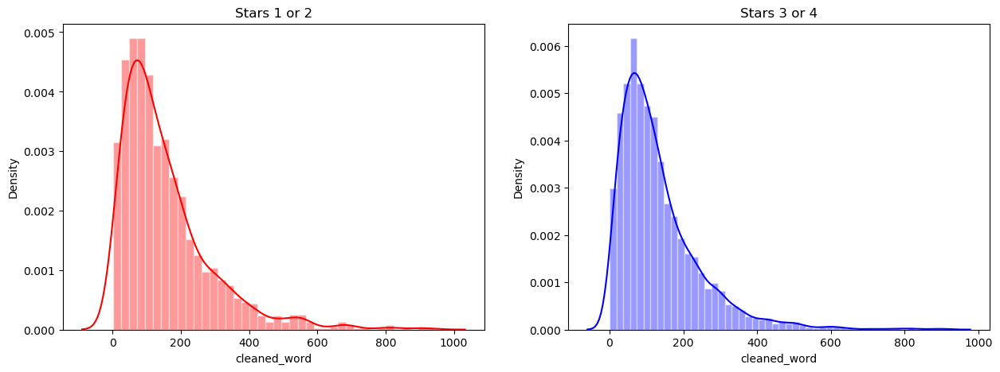

In [12]:
word_cnt_stars = pd.concat([cleaned_word, data.stars], axis = 1)
word_cnt_stars.columns = ['cleaned_word', 'stars'] 
word_cnt_stars.index.names = ["Text"]

plt.figure(figsize=(15, 5))
plt.subplot(121)
sns.distplot(word_cnt_stars.loc[word_cnt_stars["stars"].isin([1,2]), "cleaned_word"], color='red',
             hist_kws={"edgecolor": 'white'}).set_title('Stars 1 or 2')


plt.subplot(122)
sns.distplot(word_cnt_stars.loc[word_cnt_stars["stars"].isin([3,4]), "cleaned_word"], color='blue',
             hist_kws={"edgecolor": 'white'}).set_title('Stars 3 or 4')

plt.show()

In [13]:
word_cnt_stars12 = word_cnt_stars[word_cnt_stars["stars"].isin([1,2])][["cleaned_word"]]
word_cnt_stars34 = word_cnt_stars[word_cnt_stars["stars"].isin([3,4])][["cleaned_word"]]

fig = ff.create_distplot([word_cnt_stars12.cleaned_word, word_cnt_stars34.cleaned_word], ['1,2', '3,4'])
fig.show()

* When looking at the distribution plot with density curves, the two groups show highly similar distributions acorss the word count. the difference is which the frequency of the documents corresponding to the stars 3 or 4 is slightly higher than the group of 1 or 2 around the range from 0 to 150 where most of the observations are concentrated. However, it may not have a significant effect on creating a bag of words by increasing a bias among the vocabularies for the group of 1 or 2 and the group of 3 or 4 since the frequency of the documents in the group 1 or 2 stars are slightly higher than the other group outside the range of 150. 

## 2. Establish a baseline

**1).** create stratified train(80%) and test(20%) with positive (4 and 5 star) and negative (1 and 2 star) as the target.  

In [14]:
from sklearn.model_selection import train_test_split

data_pn = data.loc[data.stars != 3,:].copy()
data_pn['label'] = data_pn.stars.apply(lambda x: x//3)

X_train, X_test, y_train, y_test = train_test_split(data_pn.clean_text, 
                                                    data_pn.label, 
                                                    test_size = .2,
                                                    stratify = data_pn.label,
                                                    random_state = 123)

**2).** Build a ZeroR baseline 

In [15]:
# Benchmark accuracy (ZeroR model)
label1 = len(y_train[y_train == 1])
label0 = len(y_train[y_train == 0])
print("# of instances matching to the label 1:", len(y_train[y_train == 1]))
print("# of instances matching to the label 0:", len(y_train[y_train == 0]))
print("Majority group: label 1")
print("Baseline Accuracy = majority group/(majority group + minority group) = ", round(label1/(label1+label0), 3))

# of instances matching to the label 1: 5490
# of instances matching to the label 0: 1341
Majority group: label 1
Baseline Accuracy = majority group/(majority group + minority group) =  0.804


* ZeroR model is the baseline really easy and simple to be set and it plays a role as a benchmark for accuracy providing us with the information on the accuracy when always predicting input data as label 1. That is, any models worse than the baseline performance may imply that they have enough room for improving. 

**3).** Build a MultinomialNB baseline with the default parameters 

sklearn default parameters for MultinomialNB:
* alpha=1.0
* fit_prior=True
* class_prior=None

In [16]:
def whole_pipeline(config, clf = MultinomialNB()):
    NB_classifier = Pipeline([('vect',TfidfVectorizer()), ('clf', clf)])
    NB_classifier.set_params(**config)
    NB_classifier.fit(X_train, y_train)
    print(classification_report(y_test, NB_classifier.predict(X_test)))
    print(confusion_matrix(y_test, NB_classifier.predict(X_test)))
 
    return NB_classifier

In [17]:
config = {"clf__alpha":1.0, 
          "clf__fit_prior":True, 
          "clf__class_prior":None}

NB_classifier = whole_pipeline(config)

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       335
           1       0.80      1.00      0.89      1373

    accuracy                           0.80      1708
   macro avg       0.40      0.50      0.45      1708
weighted avg       0.65      0.80      0.72      1708

[[   0  335]
 [   0 1373]]


* The MultinomialNB model classifies all test input data into the label 1 when the base positive label is 1. Accordingly, the accuracy of the model is the same as the baseline with 0.80 (approximately 0.803 (= 1373/(1373+335))).
* the accuracy on test set is equal since the whole dataset was split into train and test sets through stratified random sampling that divides the the dataset into the same ratio for the two labels. 

## 3. Hyperparameter Tuning for MultinomialNB

I'll be sequentially tuning a few of the parameters from the pipeline starting with a config of:
```python
config = {'vect__ngram_range': (1,1),
          'vect__norm': 'l2',
          'vect__lowercase': True,
          'vect__use_idf': True,
          'vect__min_df': 1,
          'vect__stop_words': stp_wrds}
```

also add the following line prior to the return statement in `whole_pipeline()`:  
```python
print(f'Vocabulary size: {len(NB_classifier.named_steps.vect.vocabulary_):,}')
```

In [18]:
def whole_pipeline(config, clf = MultinomialNB()):
    NB_classifier = Pipeline([('vect',TfidfVectorizer()), ('clf', clf)])
    NB_classifier.set_params(**config)
    NB_classifier.fit(X_train, y_train)
    print(classification_report(y_test, NB_classifier.predict(X_test)))
    print(confusion_matrix(y_test, NB_classifier.predict(X_test)))
    print('\n')
    print(f'Vocabulary size: {len(NB_classifier.named_steps.vect.vocabulary_):,}')
    return NB_classifier

In [19]:
config = {'vect__ngram_range': (1,1),
          'vect__norm': 'l2',
          'vect__lowercase': True,
          'vect__use_idf': True,
          'vect__min_df': 1,
          'vect__stop_words': stp_wrds}

NB_classifier = whole_pipeline(config)

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       335
           1       0.80      1.00      0.89      1373

    accuracy                           0.80      1708
   macro avg       0.40      0.50      0.45      1708
weighted avg       0.65      0.80      0.72      1708

[[   0  335]
 [   0 1373]]


Vocabulary size: 24,021


**1).** Fit multiple models using a range of smoothing values, $\alpha \in [.01, .1, 1, 10, 100]$.

In [20]:
def whole_pipeline(config, clf = MultinomialNB()):
    NB_classifier = Pipeline([('vect',TfidfVectorizer()), ('clf', clf)])
    NB_classifier.set_params(**config)
    NB_classifier.fit(X_train, y_train)
    print(classification_report(y_test, NB_classifier.predict(X_test)))
    print(confusion_matrix(y_test, NB_classifier.predict(X_test)))
    print(f'Vocabulary size: {len(NB_classifier.named_steps.vect.vocabulary_):,}')
    print("\n--------------------------------------------")
    return NB_classifier

In [21]:
for alpha in [0.01,0.1,1,10,100]:
    config = {'vect__ngram_range': (1,1),
              'vect__norm': 'l2',
              'vect__lowercase': True,
              'vect__use_idf': True,
              'vect__min_df': 1,
              'vect__stop_words': stp_wrds,
              'clf__alpha': alpha}
    print("alpha:", alpha)
    NB_classifier = whole_pipeline(config)

alpha: 0.01
              precision    recall  f1-score   support

           0       0.86      0.30      0.45       335
           1       0.85      0.99      0.92      1373

    accuracy                           0.85      1708
   macro avg       0.86      0.65      0.68      1708
weighted avg       0.85      0.85      0.82      1708

[[ 102  233]
 [  17 1356]]
Vocabulary size: 24,021

--------------------------------------------
alpha: 0.1
              precision    recall  f1-score   support

           0       0.89      0.24      0.38       335
           1       0.84      0.99      0.91      1373

    accuracy                           0.85      1708
   macro avg       0.87      0.62      0.65      1708
weighted avg       0.85      0.85      0.81      1708

[[  82  253]
 [  10 1363]]
Vocabulary size: 24,021

--------------------------------------------
alpha: 1
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       335
           

* the models with alpha = 0.1 and 0.01 generate the highest accuracy 0.85
* In light of precision, recall, and f1-score, the model with alpha = 0.01 is the best among the five models.
* All the other models predict the input test data as 1 

**2).** histograms of the word coefficients for $\alpha \in [.01, 100]$  

#### Alpha = 0.01

In [22]:
def clf(config, clf = MultinomialNB()):
    NB_classifier = Pipeline([('vect',TfidfVectorizer()), ('clf', clf)])
    NB_classifier.set_params(**config)
    NB_classifier.fit(X_train, y_train)
    clf = NB_classifier.named_steps.clf
    print(f'Vocabulary size: {len(NB_classifier.named_steps.vect.vocabulary_):,}')
    return NB_classifier, clf

In [23]:
config = {'vect__ngram_range': (1,1),
          'vect__norm': 'l2',
          'vect__lowercase': True,
          'vect__use_idf': True,
          'vect__min_df': 1,
          'vect__stop_words': stp_wrds,
          'clf__alpha': 0.01}

NB_classifier_001, clf_001 = clf(config)

Vocabulary size: 24,021


#### Alpha = 100

In [24]:
def clf(config, clf = MultinomialNB()):
    NB_classifier = Pipeline([('vect',TfidfVectorizer()), ('clf', clf)])
    NB_classifier.set_params(**config)
    NB_classifier.fit(X_train, y_train)
    clf = NB_classifier.named_steps.clf
    print(f'Vocabulary size: {len(NB_classifier.named_steps.vect.vocabulary_):,}')
    return NB_classifier, clf

In [25]:
config = {'vect__ngram_range': (1,1),
          'vect__norm': 'l2',
          'vect__lowercase': True,
          'vect__use_idf': True,
          'vect__min_df': 1,
          'vect__stop_words': stp_wrds,
          'clf__alpha': 100}

NB_classifier_100, clf_100 = clf(config)

Vocabulary size: 24,021


#### Histogram for the coefficients of the two models

In [26]:
# Create a dataframe for coef
coef_001 = pd.concat([pd.DataFrame(clf_001.feature_log_prob_[0], columns = ["base_0"]), 
                      pd.DataFrame(clf_001.feature_log_prob_[1], columns = ["base_1"])],
                     axis = 1)

coef_100 = pd.concat([pd.DataFrame(clf_100.feature_log_prob_[0], columns = ["base_0"]), 
                      pd.DataFrame(clf_100.feature_log_prob_[1], columns = ["base_1"])],
                     axis = 1)

##### (a) histogram for the model with alpha = 0.01

In [27]:
fig = ff.create_distplot([coef_001.base_0, coef_001.base_1], ['prob for being 0', 'prob for being 1'])
fig.show()

* when setting the alpha with 0.01, we can see approximately two sections on the x-axis where the frequencies of the log probability of the vocabularies being 0 are higher than the frequencies of the log probability of the vocabularies being 1 across the coefficients (around -14 and -11 on the x-axis). That is, when a document contains more words whose log probability of being 0 is greater than the log probability of being 1 (smaller absolute value), the document can be classified into the label 0. 

##### (b) histogram for the model with alpha = 100

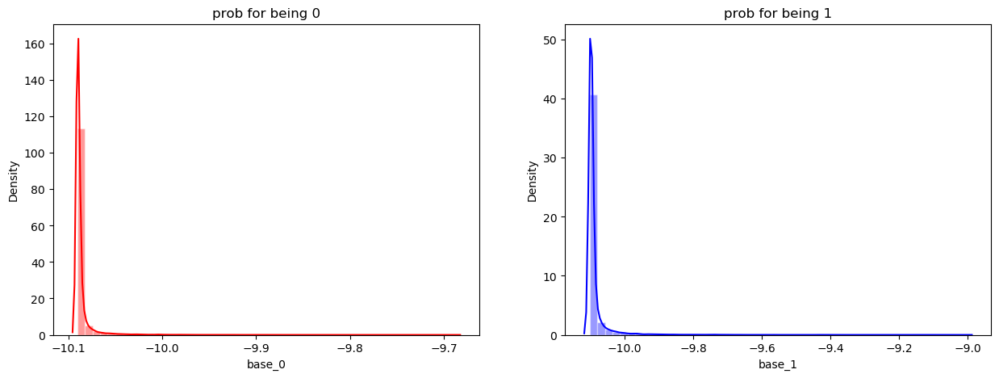

In [28]:
plt.figure(figsize=(15, 5))
plt.subplot(121)
sns.distplot(coef_100.base_0, color='red',
             hist_kws={"edgecolor": 'white'}).set_title('prob for being 0')


plt.subplot(122)
sns.distplot(coef_100.base_1, color='blue',
             hist_kws={"edgecolor": 'white'}).set_title('prob for being 1')

plt.show()

* Unlike the model with alpha = 0.01, this model consists of the vocabularies, most of which have the log probability of being 1 is greater than the log probability of being 0 (smaller absolute probability values). As a result, the input documents are most likely to be classified into the label 1.

**3).** Try each combination of **vect__min_df** $\in [1,3,5]$ and **vect__ngram_range** $\in [(1,1), (1,2)]$. 

In [29]:
def whole_pipeline(config, clf = MultinomialNB()):
    NB_classifier = Pipeline([('vect',TfidfVectorizer()), ('clf', clf)])
    NB_classifier.set_params(**config)
    NB_classifier.fit(X_train, y_train)
    print(classification_report(y_test, NB_classifier.predict(X_test)))
    print(confusion_matrix(y_test, NB_classifier.predict(X_test)))
    print(f'Vocabulary size: {len(NB_classifier.named_steps.vect.vocabulary_):,}')
    print("\n--------------------------------------------")
    return NB_classifier

In [30]:
for min_df in [1,3,5]:
    for ngram in [(1,1), (1,2)]:
        config = {'vect__norm': 'l2',
                  'vect__lowercase': True,
                  'vect__use_idf': True,
                  'vect__stop_words': stp_wrds,
                  "clf__alpha":0.01, 
                  "vect__min_df":min_df, 
                  "vect__ngram_range":ngram}
        print("min_df:", min_df,"\n ngram:",ngram)  
        NB_classifier = whole_pipeline(config)

min_df: 1 
 ngram: (1, 1)
              precision    recall  f1-score   support

           0       0.86      0.30      0.45       335
           1       0.85      0.99      0.92      1373

    accuracy                           0.85      1708
   macro avg       0.86      0.65      0.68      1708
weighted avg       0.85      0.85      0.82      1708

[[ 102  233]
 [  17 1356]]
Vocabulary size: 24,021

--------------------------------------------
min_df: 1 
 ngram: (1, 2)
              precision    recall  f1-score   support

           0       0.93      0.38      0.54       335
           1       0.87      0.99      0.93      1373

    accuracy                           0.87      1708
   macro avg       0.90      0.69      0.73      1708
weighted avg       0.88      0.87      0.85      1708

[[ 127  208]
 [   9 1364]]
Vocabulary size: 325,319

--------------------------------------------
min_df: 3 
 ngram: (1, 1)
              precision    recall  f1-score   support

           0      

* each and every model has different size of vocabulary. To be specific, the model with min_df = 1 and ngram range = (1,2) has the biggest size of vocabulary of 325,319, whereas the model with min_df = 5 and ngram range = (1,1) has the smallest size of vocabulary. This result totally makes sense because min_df = 5 represents that the learner only considers terms that appear in at least 5 documents and min_df=1 means there are no terms ignored by the min_df parameter. In addition to min_df, bigram makes multiple combinations with two successive words in a sentence, whereas unigram deals with each word independently. 

* When looking at the accuracy metric for each model, the models trained with the set of the parameters min_df = 5 and ngram = (1,2) and min_df = 3 and ngram=(1,2) produce the best performance with the accuracy of 0.88.
* the accuracy of the worst model is 0.85 and it has been trained with the set of parameters min_df=1 and ngram=(1,1) 
* the best model has been trained commonly with bigram parameter.

## 4. Walk through an Example

### Choose a mislabeled sentence from the test set with at least 7 tokens and figure out why it's been mislabeled

**1).** Build a Multinomial Naive Bayes model

In [31]:
def whole_pipeline(config, clf = MultinomialNB()):
    NB_classifier = Pipeline([('vect',TfidfVectorizer()), ('clf', clf)])
    NB_classifier.set_params(**config)
    NB_classifier.fit(X_train, y_train)
    print(classification_report(y_test, NB_classifier.predict(X_test)))
    print(confusion_matrix(y_test, NB_classifier.predict(X_test)))
    print(f'Vocabulary size: {len(NB_classifier.named_steps.vect.vocabulary_):,}')
    return NB_classifier

In [32]:
config = {'vect__ngram_range': (1,2),
          'vect__norm': 'l2',
          'vect__lowercase': True,
          'vect__use_idf': True,
          'vect__min_df': 3,
          'vect__stop_words': stp_wrds, 
          "clf__alpha":0.01}

NB_classifier = whole_pipeline(config)

              precision    recall  f1-score   support

           0       0.94      0.40      0.56       335
           1       0.87      0.99      0.93      1373

    accuracy                           0.88      1708
   macro avg       0.90      0.70      0.74      1708
weighted avg       0.88      0.88      0.86      1708

[[ 134  201]
 [   9 1364]]
Vocabulary size: 28,922


**2).** Identify the indices of which predicted labels are incorrect


In [33]:
pred_df=pd.concat([pd.DataFrame(y_test).reset_index(drop=True), 
                   pd.DataFrame(NB_classifier.predict(X_test), columns = ["pred_y"])], 
                  axis=1)
pred_df.head()

,label,pred_y
0,1,1
1,1,1
2,1,1
3,0,1
4,1,1


**3).** Select a review among the incorrectly predicted reviews
* Select an incorrectly classified review (7 <= tokens <= 10)

In [34]:
index_incrt = list(pred_df.loc[pred_df["label"] != pred_df["pred_y"]].index)
x_testDF = pd.DataFrame(X_test).reset_index(drop=True)

In [35]:
empty = []
for i in index_incrt:
    if 7 <= len(x_testDF.iloc[i, 0].split()) <= 10:
        empty.append(i)
target_review = x_testDF.iloc[empty[0],0]
print("Sentence:\n",target_review)
print("\nindex:", empty[0])
print("\nactual & predicted:\n", pred_df.iloc[empty[0],])

Sentence:
 long waits and teenage workers with bad attitudes nuff' said 

index: 1086

actual & predicted:
 label     0
pred_y    1
Name: 1086, dtype: int64


* The selected review's actual label is "0"
* its predicted label is "1"

**4).** Search the words appearing in the sentence and identify their corresponding sentiment 

In [36]:
vect, clf = NB_classifier.named_steps.vect, NB_classifier.named_steps.clf
feature_names = vect.get_feature_names()
most_inf = sorted(zip([clf.feature_log_prob_[1][i]-clf.feature_log_prob_[0][i] for i in range(len(clf.feature_log_prob_[0]))], feature_names))

for i in range(len(most_inf)):
    if re.search(most_inf[i][1], target_review):
        print(most_inf[i])
    

(-5.076123949889817, 'bad attitude')
(-2.073937932674209, 'lon')
(-1.6550014498248213, 'teenage')
(-1.4649176331292466, 'attitude')
(-1.431372927627173, 'ers')
(-1.0698265463281444, 'teen')
(-1.0391963238297386, 'bad')
(-1.0226356751208199, 'said')
(-0.8609410759764113, 'er')
(-0.7788515033127599, 'nd')
(-0.5795180369778947, 'id')
(-0.5383884602072726, 'worker')
(-0.45367950300633453, 'long wait')
(-0.272366266705923, 'wit')
(-0.20941970187733006, 'long')
(-0.01884033474134572, 'wait')
(0.08063590634330264, 'work')
(0.09360956467342163, 'workers')
(0.10122383445939143, 'age')
(0.2174557322421009, 'th')
(0.48085742278448684, 'long waits')
(0.6195074501759894, 'nuff')
(0.7380073232442541, 'attitudes')
(0.8080133735701409, 'de')
(0.8523522827714487, 'aid')
(0.8721348035891623, 'waits')
(0.9057742606513255, 'lo')
(1.7222149332667254, 'wi')
(2.421878362175903, 'na')
(2.7695408982919556, 'sa')
(3.0231681634666607, 'es')
(3.2821484849311613, 'ad')
(3.8912069049176594, 'tee')


* positive words have positive coefficients
* negative words have negative coefficients

**5).** Find the log probability of each detected vocabulary by each label

In [37]:
# Find log probability of each detected vocabulary 
log_prob_1 = sorted(zip([clf.feature_log_prob_[1][i] for i in range(len(clf.feature_log_prob_[1]))], feature_names))
log_prob_0 = sorted(zip([clf.feature_log_prob_[0][i] for i in range(len(clf.feature_log_prob_[0]))], feature_names))

voc = [most_inf[i][1] for i in range(len(most_inf)) if re.search(most_inf[i][1], target_review)]

pos_prob = []
neg_prob = []

for i in range(len(log_prob_1)):
    if log_prob_1[i][1] in voc:
        pos_prob.append(log_prob_1[i])
    elif log_prob_0[i][1] in voc:
        neg_prob.append(log_prob_0[i])

In [38]:
pos_prob

[(-15.176788651057652, 'bad attitude'),
 (-12.492597897343584, 'ers'),
 (-12.013411368856776, 'teen'),
 (-11.878001603963341, 'teenage'),
 (-11.87168187862416, 'lon'),
 (-11.688401654817525, 'wit'),
 (-11.429692510895084, 'na'),
 (-11.082029974779031, 'sa'),
 (-10.923793037673208, 'attitudes'),
 (-10.850438711949016, 'nuff'),
 (-10.828402709604326, 'es'),
 (-10.686526682873236, 'long waits'),
 (-10.569422388139825, 'ad'),
 (-10.532046671116065, 'er'),
 (-10.35649189068733, 'worker'),
 (-10.34339143547069, 'waits'),
 (-9.960363968153327, 'tee'),
 (-9.901893600408874, 'id'),
 (-9.85725451678374, 'nd'),
 (-9.806928081534226, 'aid'),
 (-9.605159866385996, 'long wait'),
 (-9.595008571430204, 'wi'),
 (-9.5871866833974, 'attitude'),
 (-9.528034388755021, 'age'),
 (-9.218724424998475, 'lo'),
 (-9.02779796581024, 'workers'),
 (-8.959268759967992, 'de'),
 (-8.248964676350962, 'th'),
 (-7.561333262665905, 'said'),
 (-7.419479892177785, 'bad'),
 (-7.357282531928314, 'long'),
 (-7.232433284118706, 

In [39]:
neg_prob

[(-13.851570873070987, 'ad'),
 (-13.851570873070987, 'es'),
 (-13.851570873070987, 'na'),
 (-13.851570873070987, 'sa'),
 (-13.851570873070987, 'tee'),
 (-11.661800360917463, 'attitudes'),
 (-11.469946162125005, 'nuff'),
 (-11.416035388111602, 'wit'),
 (-11.31722350469693, 'wi'),
 (-11.215526239059852, 'waits'),
 (-11.167384105657723, 'long waits'),
 (-11.061224969716411, 'ers'),
 (-10.943584822528631, 'teen'),
 (-10.659280364305674, 'aid'),
 (-10.22300015413852, 'teenage'),
 (-10.124498685649801, 'lo'),
 (-10.100664701167835, 'bad attitude'),
 (-9.818103430480058, 'worker'),
 (-9.797743945949952, 'lon'),
 (-9.767282133538133, 'de'),
 (-9.671105595139654, 'er'),
 (-9.629258223214412, 'age'),
 (-9.32237556343098, 'id'),
 (-9.151480363379662, 'long wait'),
 (-9.121407530483662, 'workers'),
 (-9.07840301347098, 'nd'),
 (-8.466420408593063, 'th'),
 (-8.122269050268153, 'attitude'),
 (-7.313069190462008, 'work'),
 (-7.147862830050984, 'long'),
 (-6.942880890989381, 'wait'),
 (-6.538697587545

**6).** Compare P(1 | x1,x2,..,xn) and P(0 | x1,x2,..,xn)
* omit denominator 

In [40]:
# Calculate the prior probability for each label 
yTrain = pd.DataFrame(y_train)
label1 = len(yTrain.loc[yTrain["label"] == 1])
label0 = len(yTrain.loc[yTrain["label"] == 0])
p1 = label1/(label1+label0)
p0 = label0/(label1+label0)
print("P(label = 1): ",p1)
print("P(label = 0): ",p0)

P(label = 1):  0.8036890645586298
P(label = 0):  0.1963109354413702


In [41]:
# take exponential to take log off
print("Probability of the sentence being classified into 1:\n",np.prod([math.exp(pos_prob[i][0]) for i in range(len(pos_prob))])*p1)

print("Probability of the sentence being classified into 0:\n",np.prod([math.exp(neg_prob[i][0]) for i in range(len(neg_prob))])*p0)


Probability of the sentence being classified into 1:
 3.0172351399105757e-145
Probability of the sentence being classified into 0:
 9.658816670991572e-148


#### as the final probabilities are calculated with log probabilities, the lower the absolute value is, the higher the actual probability is:
*  P(1 | x1,x2,..,xn) > P(0 | x1,x2,..,xn)
* this shows how the selected sentence was not classified into class 0 but 1